## Shell Contact Example

In [1]:
# !pip install debugpy

In [ ]:
import numpy as np

import dismech


geom = dismech.GeomParams(rod_r0=0.005,
                          shell_h=0.005)

material = dismech.Material(density=1200,
                            youngs_rod=0,
                            youngs_shell=1e10,
                            poisson_rod=0,
                            poisson_shell=0.5)

shell_contact_sim = dismech.SimParams(static_sim=False,
                                  two_d_sim=False,   # no twisting
                                  use_mid_edge=False,
                                  use_line_search=False,
                                  show_floor=False,
                                  log_data=True,
                                  log_step=1,
                                  dt=2e-3,
                                  max_iter=100,
                                  total_time=2,
                                  plot_step=1,
                                  tol=1e-4,
                                  ftol=1e-4,
                                  dtol=1e-2)

env = dismech.Environment()
env.add_force('gravity', g=np.array([0.0, 0.0, 0.0])) # neutral bouyancy
env.add_force('damping', eta = 50)
# # env.add_force('aerodynamics', rho=1000, cd=1)
env.add_force('hydrodynamics', rho=1000, cd=1)
env.add_force('thrust', thrust_coeff = 1000)

# env.add_force('selfContact', delta=0.01*2*5e-3, h=5e-3)
# env.set_static()

# geo = dismech.Geometry.from_txt('input hemisphere more dense.txt')
geo = dismech.Geometry.from_txt('input_radially_sym_hemisphere.txt')
# geo = dismech.Geometry.from_txt('input hemisphere most dense.txt')

robot = dismech.SoftRobot(geom, material, geo, shell_contact_sim, env)

ValueError: 'list' argument must have no negative elements

In [3]:
log_node = np.array(np.where(
    robot.state.q[robot.node_dof_indices].reshape(-1, 3)[:, 2] >= 0.999)[0])

In [4]:
print("# nodes: ", np.shape(robot.nodes))
print("# faces: ", np.shape(robot.face_nodes_shell))

# nodes:  (144, 3)
# faces:  (245, 3)


### Time Stepping

As we are performing a static simulation, we must change gravity for each time step.

In [5]:
stepper = dismech.ImplicitEulerTimeStepper(robot)

In [6]:
from scipy.signal import sawtooth
import numpy as np

# One-time preprocessing function to compute tangential hinge mask
def compute_tangential_mask(robot, angle_threshold_deg=30):
    hinges = robot.hinge_springs.nodes_ind[:, 0:2]
    tangential_mask = np.zeros(len(hinges), dtype=bool)
    apex_z = np.max(robot.state.q[:robot.end_node_dof_index].reshape(-1, 3)[:, 2]) # max height of the apex

    for i, (n1, n2) in enumerate(hinges):
        p1 = robot.state.q[robot.map_node_to_dof(n1)]
        p2 = robot.state.q[robot.map_node_to_dof(n2)]
        mid = 0.5 * (p1 + p2)
        r_mid = mid - [0,0,apex_z]

        hinge_vec = p2 - p1
        hinge_vec /= np.linalg.norm(hinge_vec)

        radial_vec = r_mid / np.linalg.norm(r_mid)

        angle_cos = np.dot(hinge_vec, radial_vec)
        angle_deg = np.degrees(np.arccos(np.clip(np.abs(angle_cos), -1.0, 1.0)))

        if angle_deg > (90 - angle_threshold_deg):
            tangential_mask[i] = True

    return tangential_mask



# Precompute tangential hinge mask ONCE
robot.tangential_hinge_mask = compute_tangential_mask(robot)

print("hinges:", robot.hinge_springs.nodes_ind[:, 0:2])
print("tangential hinges:",robot.tangential_hinge_mask )


# Modified actuation function
def actuate_jellyfish(robot, t):
    pulse_freq = 2                   # Hz
    pulse_amplitude = 3*np.pi/5   # radians
    theta_rest = 0.0

    T = 1.0 / pulse_freq
    s = 0.5 * (1 - sawtooth(2 * np.pi * t / T, width=0.3))  # asymmetric contraction
    theta_base = theta_rest - pulse_amplitude * s

    n_hinges = robot.hinge_springs.inc_strain.shape[0]
    theta_bars = np.zeros(n_hinges)

    q_nodes = robot.state.q[:robot.end_node_dof_index].reshape(-1, 3)
    apex_z = np.max(q_nodes[:, 2])
    radii = np.linalg.norm(q_nodes[:, :2], axis=1)
    base_radius = np.max(radii)

    for i in range(n_hinges):
        if not robot.tangential_hinge_mask[i]:
            continue  # skip non-tangential hinges

        n1, n2 = robot.hinge_springs.nodes_ind[i, 0:2]
        p1 = robot.state.q[robot.map_node_to_dof(n1)]
        p2 = robot.state.q[robot.map_node_to_dof(n2)]
        midpoint = 0.5 * (p1 + p2)

        r = np.linalg.norm(midpoint[:2]) / base_radius
        z = midpoint[2] / apex_z

        # traveling wave with delay based on height
        # phase_delay = 0.1 * z
        phase_delay = 0.15* (1 - z)
        theta = theta_rest - pulse_amplitude * 0.5 * (1 - sawtooth(2 * np.pi * (t - phase_delay) / T, width=0.3))

        # scale actuation by radial location
        # scale = 3 * r**2 - 2 * r**3
        scale = 0.3 + 0.7 * (3 * r**2 - 2 * r**3) # smoothstep function for scaling
        # scale = 1
        theta_bars[i] = theta * scale

    robot.hinge_springs.inc_strain = theta_bars
    return robot

# Assign the stepper callback
stepper.before_step = actuate_jellyfish


hinges: [[ 55  31]
 [ 53  54]
 [ 54  31]
 [ 31  32]
 [ 35  34]
 [ 60  35]
 [ 35  59]
 [ 90 129]
 [ 90  91]
 [ 60  59]
 [ 59  91]
 [ 55  54]
 [ 83  53]
 [ 53  82]
 [ 32  55]
 [ 88 126]
 [ 35  36]
 [ 18  17]
 [ 17  35]
 [ 35  18]
 [ 17   6]
 [ 15  32]
 [ 34  17]
 [ 17  16]
 [ 29  51]
 [ 79 116]
 [115  79]
 [114  79]
 [114  78]
 [ 78  79]
 [ 51  28]
 [ 50  79]
 [ 79  80]
 [ 50  80]
 [ 51  50]
 [108  73]
 [ 73  72]
 [107  73]
 [ 74 108]
 [ 97  98]
 [ 45  73]
 [ 73  74]
 [ 46  73]
 [ 46  74]
 [ 46  75]
 [ 48  26]
 [ 28  29]
 [ 29  13]
 [ 13  14]
 [ 14   4]
 [  4   3]
 [ 13   4]
 [ 28  13]
 [  1   8]
 [  1  21]
 [  9   1]
 [ 59  34]
 [ 90  59]
 [ 59  58]
 [ 91 129]
 [ 60  91]
 [ 92  91]
 [ 91 130]
 [130  92]
 [122  85]
 [ 54  83]
 [ 83  84]
 [ 85  54]
 [ 54  84]
 [ 84  85]
 [ 82  52]
 [ 81  82]
 [ 81  52]
 [ 52  51]
 [ 51  80]
 [ 81  51]
 [ 83  82]
 [120  83]
 [ 83 119]
 [ 82 118]
 [119  82]
 [ 53  31]
 [ 52  53]
 [ 53  30]
 [ 29  52]
 [ 52  30]
 [ 14  29]
 [ 29  30]
 [ 15  14]
 [ 14  30]
 [

In [7]:
print(robot.hinge_springs.inc_strain.shape)

(347,)


In [8]:
robots = stepper.simulate()

qs = np.stack([robot.state.q for robot in robots])

7257.132044675515
24626.643468798142
2549.543210534881
4877.203541474776
15.275712466039499
current_time:  0.002
2899.352039798069
145762.07954756674
2731.308493851144
3137.3571172413635
33.38948355651786
current_time:  0.004
3143.238365709594
79133.79164297588
616.7443551998629
305.0956324862808
1.0818310817989034
current_time:  0.006
3142.073705905129
57292.43812491563
263.1791591061604
68.24081852208803
current_time:  0.008
3090.553221554365
61738.339171678774
189.34303063545244
20.500819777386628
current_time:  0.01
3066.443353931863
77022.18481011466
175.6514389375631
8.783943787740213
current_time:  0.012
3058.000827467717
86728.83915058478
162.97139313699142
21.09182260342088
current_time:  0.014
3036.976044202377
85822.99946462612
130.9858222340681
23.94066959398517
current_time:  0.016
2992.4138118044516
79434.60873674345
104.0851220619789
21.14454663148709
current_time:  0.018000000000000002
2930.945996739028
73173.77086895064
87.34927986809244
19.16992946319331
current_time:

In [9]:
qs

array([[ 9.43857295e-06,  4.60572921e-06,  9.99018390e-01, ...,
         9.85245663e-01, -1.51235449e-01, -2.02448171e-04],
       [ 1.33392300e-05,  2.11114597e-05,  9.99030621e-01, ...,
         9.81354067e-01, -1.48871607e-01, -3.79780079e-04],
       [ 2.11647766e-05,  4.96848733e-05,  9.99249909e-01, ...,
         9.77982811e-01, -1.46322954e-01, -3.66993873e-04],
       ...,
       [ 2.11343137e-02,  3.00929904e-02,  1.04520156e+00, ...,
         1.12722548e+00, -9.67129505e-02,  1.43843213e-01],
       [ 2.12088010e-02,  3.01615000e-02,  1.04510672e+00, ...,
         1.12607378e+00, -9.63763548e-02,  1.43498992e-01],
       [ 2.12842535e-02,  3.02310717e-02,  1.04500718e+00, ...,
         1.12489462e+00, -9.60301282e-02,  1.43150241e-01]],
      shape=(1000, 432))

[[9.43857295e-06 4.60572921e-06 9.99018390e-01]
 [1.33392300e-05 2.11114597e-05 9.99030621e-01]
 [2.11647766e-05 4.96848733e-05 9.99249909e-01]
 ...
 [2.11343137e-02 3.00929904e-02 1.04520156e+00]
 [2.12088010e-02 3.01615000e-02 1.04510672e+00]
 [2.12842535e-02 3.02310717e-02 1.04500718e+00]]


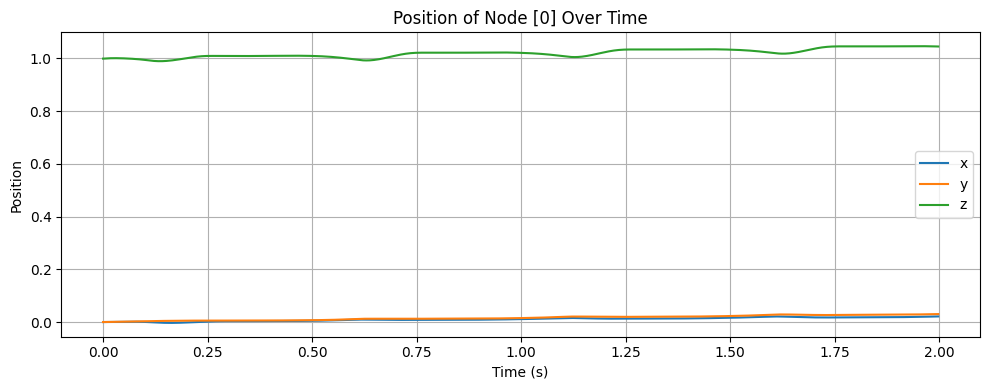

In [9]:
import matplotlib.pyplot as plt

# Extract the DOF indices (x, y, z) of the node you want to track
log_node_dofs = robot.map_node_to_dof(log_node)  # e.g., [ix, iy, iz]

# Extract position of that node across all timesteps
logged = qs[:, log_node_dofs].squeeze()  # shape (n_timesteps, 3)

# Plot x, y, z over time
t = np.arange(qs.shape[0]) * robot.sim_params.dt

print(logged)

plt.figure(figsize=(10, 4))
plt.plot(t, logged[:, 0], label='x')
plt.plot(t, logged[:, 1], label='y')
plt.plot(t, logged[:, 2], label='z')
plt.xlabel('Time (s)')
plt.ylabel('Position')
plt.title(f'Position of Node {log_node} Over Time')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [10]:
t = np.arange(robot.sim_params.total_time, step=robot.sim_params.dt)
options = dismech.AnimationOptions(title='Shell contact p2p', plot_step=10)

fig = dismech.get_interactive_animation_plotly(robot, t, qs, options)
fig.show()

101


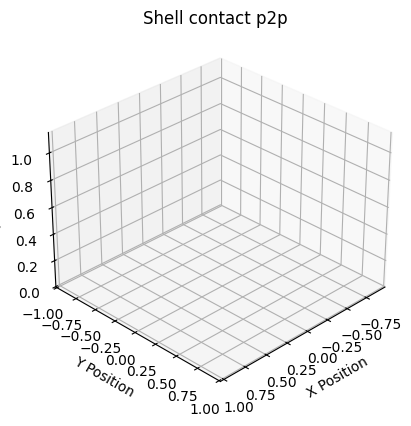

In [11]:
ani = dismech.get_animation(robot, t, qs, options)
ani.save('jellyfish.gif')